# Clustering Hobbies & Interests

## Data Summary

This dataset from https://www.kaggle.com/miroslavsabo/young-people-survey contains the responses of 1010 participants (age 15-30) over 150 questions about their interests and hobbies (e.g., music, movies, etc.). The features include question items from the following categories:

* Music preferences (19 items)
* Movie preferences (12 items)
* **Hobbies & interests (32 items)**
* Phobias (10 items)
* Health habits (3 items)
* Personality traits, views on life, & opinions (57 items)
* Spending habits (7 items)
* Demographics (10 items)  

All questions were asked with a 1-5 response scale from not interested (1) to very interested (5).  

## Analysis Objectives

In this analysis, I am going to focus on clustering people according to their hobbies and interests — can we identify similar groups of people, and what similar interests do those people tend to have? 

To do so, I am going to compare the following clustering models:  
* K-means (selecting the optimal number number of clusters from inertia)  
* Hierarchical Agglomerative Clustering with:  
    * Complete Linkage  
    * Ward Linkage  

## Data Exploration and Cleaning

This section describes the data exploration and cleaning steps as follows:  
1) filter data to select only hobbies  
2) remove rows with missing data  
3) check for skewed variables and log transform  
4) scale all variables  
5) plot correlations between all hobbies  

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering, MeanShift, estimate_bandwidth
from kneed import KneeLocator
from scipy.spatial.distance import pdist, squareform
import scipy.cluster.hierarchy as sch
import networkx as nx

# visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
from IPython.display import set_matplotlib_formats
import seaborn as sns

%matplotlib inline

# set to show vector images
set_matplotlib_formats('pdf', 'svg')

In [2]:
# load in the data:
data = pd.read_csv('interests_responses.csv')
data.shape

(1010, 150)

First, I'm filtering the data to just select the hobbies and interests columns:

In [3]:
hobbies = data.iloc[:,31:63].copy()

In [4]:
print('Hobbies contains the following', hobbies.shape[1], 'items:\n\n',hobbies.columns.tolist())

Hobbies contains the following 32 items:

 ['History', 'Psychology', 'Politics', 'Mathematics', 'Physics', 'Internet', 'PC', 'Economy Management', 'Biology', 'Chemistry', 'Reading', 'Geography', 'Foreign languages', 'Medicine', 'Law', 'Cars', 'Art exhibitions', 'Religion', 'Countryside, outdoors', 'Dancing', 'Musical instruments', 'Writing', 'Passive sport', 'Active sport', 'Gardening', 'Celebrities', 'Shopping', 'Science and technology', 'Theatre', 'Fun with friends', 'Adrenaline sports', 'Pets']


Check if there are any duplicate rows:

In [5]:
hobbies.duplicated().sum()

0

Now check for any missing values:

In [6]:
hobbies.isna().sum()

History                    2
Psychology                 5
Politics                   1
Mathematics                3
Physics                    3
Internet                   4
PC                         6
Economy Management         5
Biology                    6
Chemistry                 10
Reading                    6
Geography                  9
Foreign languages          5
Medicine                   5
Law                        1
Cars                       4
Art exhibitions            6
Religion                   3
Countryside, outdoors      7
Dancing                    3
Musical instruments        1
Writing                    6
Passive sport             15
Active sport               4
Gardening                  7
Celebrities                2
Shopping                   2
Science and technology     6
Theatre                    8
Fun with friends           4
Adrenaline sports          3
Pets                       4
dtype: int64

We have a lot of data, so I'm going to remove any rows that contain missing values:

In [7]:
hobbies.dropna(axis=0, inplace=True)
hobbies.reset_index(drop=True, inplace=True)
hobbies.shape

(886, 32)

In [8]:
hobbies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 886 entries, 0 to 885
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   History                 886 non-null    float64
 1   Psychology              886 non-null    float64
 2   Politics                886 non-null    float64
 3   Mathematics             886 non-null    float64
 4   Physics                 886 non-null    float64
 5   Internet                886 non-null    float64
 6   PC                      886 non-null    float64
 7   Economy Management      886 non-null    float64
 8   Biology                 886 non-null    float64
 9   Chemistry               886 non-null    float64
 10  Reading                 886 non-null    float64
 11  Geography               886 non-null    float64
 12  Foreign languages       886 non-null    float64
 13  Medicine                886 non-null    float64
 14  Law                     886 non-null    fl

Next, I'm going to check if any hobbies have a particularly skewed distribution (> .75):

In [9]:
skew_columns = hobbies.skew()

# right skewed data (unpopular hobbies)
unpopular_columns = skew_columns.loc[skew_columns > 0.75]
print('\nright-skewed features:\n',unpopular_columns)

# left skewed data (popular hobbies)
popular_columns = skew_columns.loc[skew_columns < -0.75]
print('\nleft-skewed features:\n',popular_columns)


right-skewed features:
 Physics      0.906544
Chemistry    0.979680
Writing      1.239168
Gardening    1.208406
dtype: float64

left-skewed features:
 Internet           -0.907608
Fun with friends   -1.621596
dtype: float64


Here are the distributions of all of the hobbies, with right-skewed features shown in orange and left-skewed features shown in green:

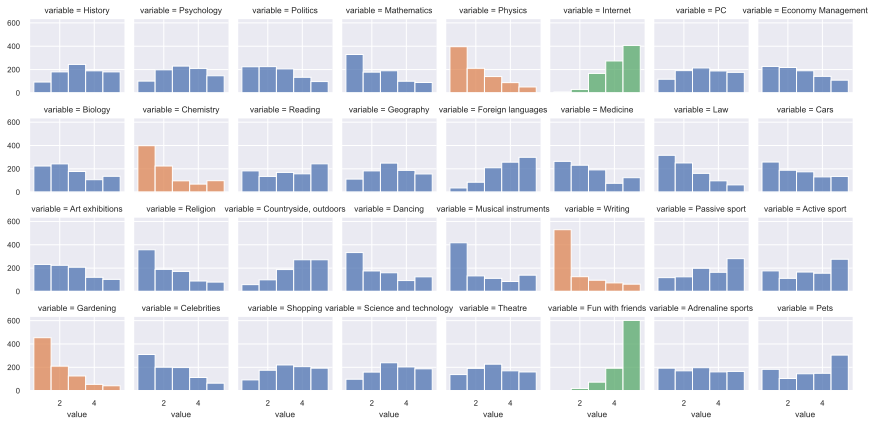

In [10]:
plot_data = hobbies.melt()
plot_data["skew"] = "normal"
plot_data.loc[plot_data.variable.isin(unpopular_columns.index),"skew"] = "right"
plot_data.loc[plot_data.variable.isin(popular_columns.index),"skew"] = "left"

sns.set(font_scale=0.7)
g = sns.FacetGrid(plot_data,
                  col="variable", height=1.5, col_wrap=8,
                  hue="skew")
g.map(sns.histplot, "value", bins=5, discrete=True)
plt.show()

Log-transform skewed variables:

In [11]:
# Perform log transform on right-skewed columns
for col in unpopular_columns.index.tolist():
    hobbies[col] = np.log1p(hobbies[col])
    
# Perform log transform on left-skewed columns
# requires reverse-scoring first
for col in popular_columns.index.tolist():
    values = np.log1p(6 - hobbies[col])
    # and reverse, reverse scoring
    hobbies[col] = values.max()+.001 - values

And convert all variables to the same scale with StandardScaler():

In [12]:
hobbies_scaled = pd.DataFrame(StandardScaler().fit_transform(hobbies), columns = hobbies.columns)
hobbies_scaled.head(3)

,History,Psychology,Politics,Mathematics,Physics,Internet,PC,Economy Management,Biology,Chemistry,...,Passive sport,Active sport,Gardening,Celebrities,Shopping,Science and technology,Theatre,Fun with friends,Adrenaline sports,Pets
0,-1.740991,1.504239,-1.234273,0.468868,0.895596,0.976347,-0.098577,1.753553,0.254924,0.817017,...,-1.723788,1.145349,2.259511,-1.058872,0.574197,0.586558,-0.775077,0.640246,0.761949,0.436557
1,-1.740991,-0.093790,1.064745,1.957820,0.121446,-0.356622,0.660894,1.753553,-1.197568,-0.942404,...,-1.723788,-1.511141,-0.858951,-0.271824,-0.204882,-0.196108,-0.775077,-0.936646,-0.657792,1.084445
2,-1.740991,-0.892804,-1.234273,1.957820,0.121446,-0.356622,-0.858047,1.008040,-1.197568,-0.942404,...,1.134941,-0.847018,-0.858951,-1.058872,0.574197,-0.978774,1.491320,0.640246,1.471819,1.084445


Finally, let's visualize a heatmap of correlations between our 32 hobbies across all subjects, grouped into similar clusters with hierarchical clustering:

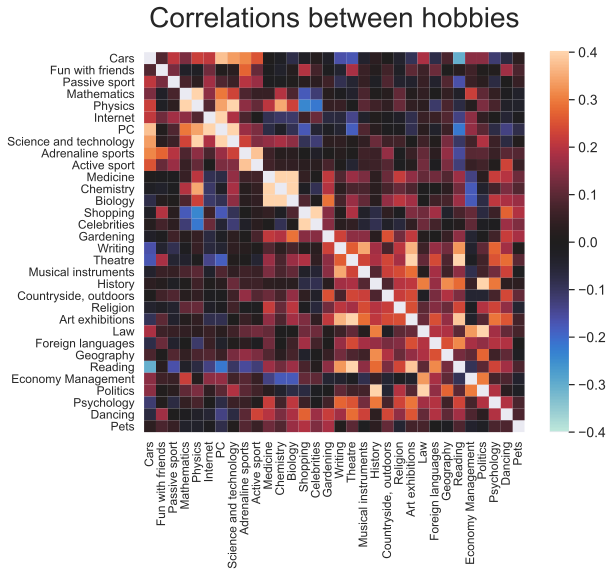

In [13]:
cors = hobbies_scaled.corr()

X = cors.values
d = sch.distance.pdist(X)
L = sch.single(d)
ind = sch.fcluster(L, 0.5*d.max(), 'distance')
columns = [cors.columns.tolist()[i] for i in list((np.argsort(ind)))]
cors = cors.loc[columns,columns]

#mask to remove diagonal
my_mask = np.zeros(cors.shape)
np.fill_diagonal(my_mask, 1)

# heatmap
plt.figure(figsize=(9,7), edgecolor="black")
ax = sns.heatmap(cors, mask=my_mask, 
                 cmap='icefire',vmin=-.4, vmax=.4,
                 square=True)
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12)
plt.title('Correlations between hobbies', fontsize=28, y=1.05)

# custom colorbar axis
cax = plt.gcf().axes[-1]
cax.tick_params(labelsize=14)

plt.show()

## Clustering Models

Define functions for plotting/calculating clustering results:

In [14]:
# plot subjects as a graph based on their euclidean distance to others across all hobbies
def plot_distances(df, n_cluster, cluster_labels, cluster_name):
    # get distance matrix of subjects:
    dist_matrix = squareform(pdist(df.values, metric='euclidean'))

    # keep top 5% of edges (closest) for visualization
    l_mat = np.tril(dist_matrix)
    dist_matrix[dist_matrix > np.quantile(l_mat[l_mat > 0],0.05)] = 0

    # for visualization, remove any rows (participants) that are not connected to anyone else
    idx = np.where(dist_matrix.sum(axis=1) == 0)[0].tolist()
    dist_matrix = np.delete(np.delete(dist_matrix, idx, 0), idx, 1)
    
    # color based on clusters
    this_cmap = plt.cm.get_cmap('mako', n_cluster)

    # create networkx graph object from thresholded matrix
    G = nx.from_numpy_matrix(dist_matrix) 
    G.edges(data=True)
    pos = nx.spring_layout(G, seed=20)

    # draw network
    fig = plt.figure(figsize=(10,8))
    nx.draw_networkx_edges(G, pos, alpha=0.25, edge_color="gray")
    nx.draw_networkx_nodes(G, pos, node_size=40,
                           cmap=this_cmap, node_color=list(np.delete(cluster_labels, idx))
                           )

    # add colorbar for communities
    sm = plt.cm.ScalarMappable(cmap=this_cmap, norm=plt.Normalize(vmin=.5, vmax=n_cluster+.5))
    sm.set_array([])
    cb = plt.colorbar(sm, ticks=[*range(1,n_cluster+1)],
                     shrink=0.6)
    cb.ax.tick_params(labelsize=16) 
    cb.set_label('Cluster', fontsize=20, rotation=270, labelpad=25)

    plt.title('Hobby clusters: ' + cluster_name, fontsize=24, y=1, x=0.6)
    plt.axis("off")
    plt.show()

In [15]:
# show the top 5 hobbies per cluster:
def top_5_hobbies(centroids):
    
    for c in centroids.index:
        cluster = centroids.loc[c,:].transpose().sort_values(ascending=False)
        print('\nCluster',c+1,'top hobbies:\n',cluster[:5].index.tolist())
    print('\n')

In [16]:
# show centroid values for all hobbies:
def plot_centroids(n_cluster, centroids, cluster_name):
    
    centroids = centroids.reset_index()
    
    # color based on clusters
    this_cmap = plt.cm.get_cmap('mako', n_cluster)
    
    # colormap as hex codes for seaborn
    this_hex = []
    for i in range(this_cmap.N):
        rgb = this_cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        this_hex.append(mpl.colors.rgb2hex(rgb))

    # plot
    plt.figure(figsize=(14,4))
    plt.axhline(y=0, color="black", zorder=0)
    sns.barplot(data=centroids.melt(id_vars="index"),
                x="variable", y="value", hue="index",
                palette=this_hex)
    plt.xlabel('')
    plt.xticks(fontsize=12,rotation=90)
    plt.ylabel('')
    plt.yticks(fontsize=16)  
    plt.title(cluster_name + ' : hobby preference by cluster', fontsize=24, y=1.05)
    plt.show()

### K-means

For k-means, I'm calculating the optimal number of clusters to use by finding the 'elbow' of inertia values:

Using 4 clusters for K-Means



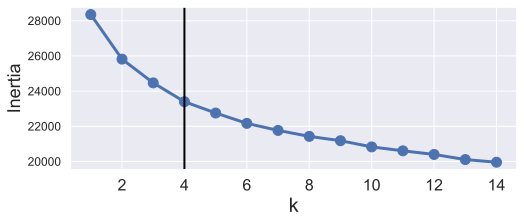

In [17]:
distortions = []
K = range(1,15)
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=10).fit(hobbies_scaled)
    distortions.append(kmeanModel.inertia_)

# use kneelocator to find the elbow
myk = KneeLocator([*K], distortions, curve="convex", direction="decreasing").elbow
print('Using',myk,'clusters for K-Means\n')

# plot
plt.figure(figsize=(8,3))
plt.plot(K, distortions, 'o-', linewidth=3,  markersize=10)
plt.xlabel('k', fontsize=20)
plt.ylabel('Inertia', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=12)
plt.axvline(x=myk, color="black", linewidth=2)
plt.show()

In [18]:
# Run K-Means with optimal k
mykmeans = KMeans(n_clusters=myk, random_state=10).fit(hobbies_scaled)

# fetch cluster centroids and labels:
kmeans_centroids = pd.DataFrame(mykmeans.cluster_centers_, columns = hobbies_scaled.columns)
kmeans_labels = mykmeans.labels_

Show participants based on their euclidean distance from others, colored by their k-means cluster. Shows the top 5% of edges:

In [19]:
plot_distances(hobbies_scaled, myk, kmeans_labels, 'K-Means')

This plot shows that clusters 1 and 3 are reasonably well segregated, whereas clusters 2 and 4 are a bit more overlapping.

To understand what drives these clusters, below I'm calculating the top 5 hobbies of each cluster based on the cluster centroids:

In [20]:
top_5_hobbies(kmeans_centroids)


Cluster 1 top hobbies:
 ['PC', 'Cars', 'Science and technology', 'Physics', 'Internet']

Cluster 2 top hobbies:
 ['Shopping', 'Celebrities', 'Reading', 'Foreign languages', 'Theatre']

Cluster 3 top hobbies:
 ['Politics', 'History', 'Art exhibitions', 'Law', 'Psychology']

Cluster 4 top hobbies:
 ['Biology', 'Chemistry', 'Medicine', 'Gardening', 'Physics']




Plot importance of each feature to each cluster (mean - centroid - rating per cluster):

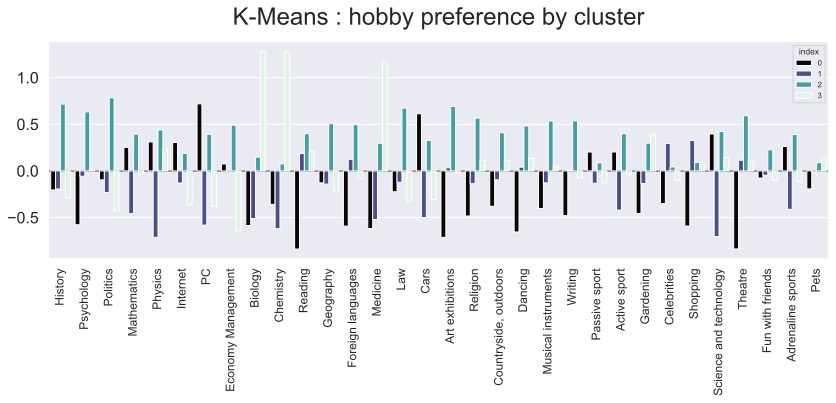

In [21]:
plot_centroids(myk, kmeans_centroids, 'K-Means')

### Complete Linkage

In [22]:
# fit complete linkage clustering model with 4 clusters (same as k-means)
hobbies_complete = hobbies_scaled.copy()

agg_c = AgglomerativeClustering(n_clusters=myk,
                                linkage='complete')
hobbies_complete['cluster'] = agg_c.fit(hobbies_scaled).labels_

In [23]:
# get the average hobby score per cluster (does not return centroids, unlike kmeans):
complete_summary = hobbies_complete.groupby('cluster').mean().reset_index(drop=True)

Show participants based on their euclidean distance from others, colored by their cluster. Shows the top 5% of edges for visualization:

In [24]:
plot_distances(hobbies_scaled, myk, hobbies_complete['cluster'].tolist(), 'Complete Linkage')

Based on the network visualization of euclidean distances between people (based on all hobbies), the complete linkage models appears to do a worse job of grouping people into segregated clusters.  

As above, here are the top 5 hobbies for each cluster:

In [25]:
top_5_hobbies(complete_summary)


Cluster 1 top hobbies:
 ['PC', 'Cars', 'Science and technology', 'Adrenaline sports', 'Physics']

Cluster 2 top hobbies:
 ['Shopping', 'Celebrities', 'Economy Management', 'Reading', 'Writing']

Cluster 3 top hobbies:
 ['Writing', 'Reading', 'Musical instruments', 'Theatre', 'Art exhibitions']

Cluster 4 top hobbies:
 ['Politics', 'History', 'Law', 'Art exhibitions', 'Medicine']




Importance of each hobby to each cluster:

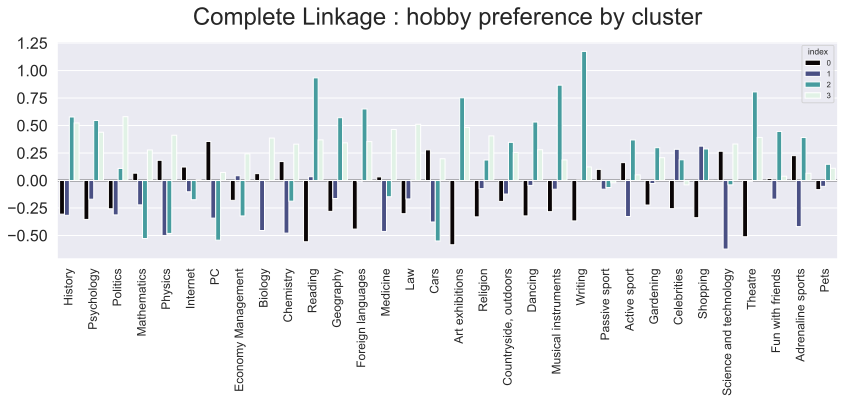

In [26]:
plot_centroids(myk, complete_summary, 'Complete Linkage')

### Ward Linkage

In [27]:
# fit ward clustering model with 4 clusters (same as k-means)
hobbies_ward = hobbies_scaled.copy()

agg_w = AgglomerativeClustering(n_clusters=myk,
                                linkage='ward')
hobbies_ward['cluster'] = agg_w.fit(hobbies_scaled).labels_

In [28]:
# get the average hobby score per cluster (does not return centroids, unlike kmeans):
ward_summary = hobbies_ward.groupby('cluster').mean().reset_index(drop=True)

Show participants based on their euclidean distance from others, colored by their cluster. Shows the top 5% of edges for visualization:

In [29]:
plot_distances(hobbies_scaled, myk, hobbies_ward['cluster'].tolist(), 'Ward Linkage')

This model does a better job than complete linkage of visualy separating people into non-overlapping clusters.

As above, here are the top 5 hobbies for each cluster:

In [30]:
top_5_hobbies(ward_summary)


Cluster 1 top hobbies:
 ['PC', 'Internet', 'Cars', 'Economy Management', 'Celebrities']

Cluster 2 top hobbies:
 ['Politics', 'Law', 'History', 'Geography', 'Economy Management']

Cluster 3 top hobbies:
 ['Biology', 'Chemistry', 'Medicine', 'Gardening', 'Pets']

Cluster 4 top hobbies:
 ['Writing', 'Art exhibitions', 'Reading', 'Theatre', 'Musical instruments']




Importance of each hobby to each cluster:

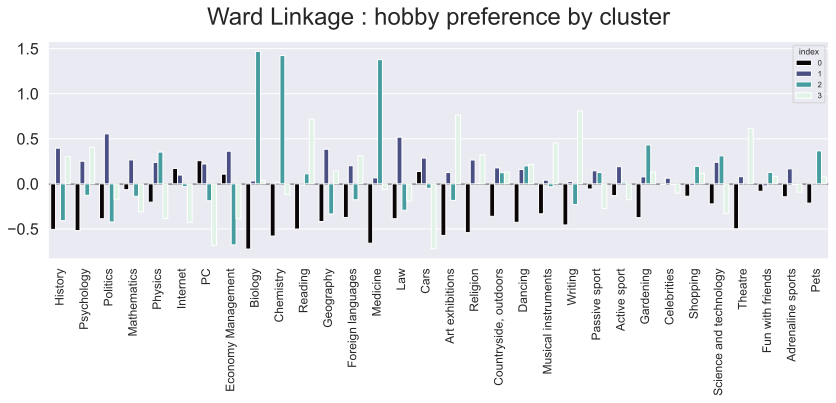

In [31]:
plot_centroids(myk, ward_summary, 'Ward Linkage')

## Key Findings & Model Recommendation

Based on the above model comparisons (K-Means, Complete and Ward linkage for Hierarchical Agglomerative Clustering), there are some notable differences:  

* K-Means seems to do the best job at separating people into distinct clusters based on euclidean distance (inferred visually from the network).  
* K-Means and Ward Linkage appear to be driven by similar features for clustering people — both are particularly sensitive to the high correlations between biology, chemistry, and medicine interests.  
* Complete linkage appears to do the worst job at separating people based on their distance across all features, but does show a bias towards slightly different hobbies — it is sensitive to the high correlation between preferences for arts subjects (e.g., writing, music, reading, theater).  
  
These differences mean that the models give overlapping, but not identical, results in terms of the top 5 hobbies associated with different clusters.   Therefore, although K-Means might be slightly better when considering distance based on overall hobby preference, it might be worth combining results from the different models when considering how people might be more or less similar to each other in certain areas.   

Overall, we could broadly define people's hobbies and interests according to the following prevailing themes:  
1) Arts  
2) Science  
3) Politics  
4) Technology  

## Limitations and Future modifications

There is a reasonably large number of features (hobbies) going into the clustering models, and so it might be beneficial to use dimensionality reduction, such as PCA, prior to clustering people. It might also be useful to consider a density-based method, such as DBSCAN, that might be better at detecting more unusual/uneven patterns of clustering or relationships and has the advantage of not being influenced by noise (outlying) values.